In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.tsa.arima.model import ARIMA
from wordcloud import WordCloud
import re




In [2]:
# Загрузка набора данных
df = pd.read_csv('vaccination_all_tweets.csv')


In [3]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                228207 non-null  int64 
 1   user_name         228205 non-null  object
 2   user_location     161296 non-null  object
 3   user_description  211184 non-null  object
 4   user_created      228207 non-null  object
 5   user_followers    228207 non-null  int64 
 6   user_friends      228207 non-null  int64 
 7   user_favourites   228207 non-null  int64 
 8   user_verified     228207 non-null  bool  
 9   date              228207 non-null  object
 10  text              228207 non-null  object
 11  hashtags          178504 non-null  object
 12  source            228088 non-null  object
 13  retweets          228207 non-null  int64 
 14  favorites         228207 non-null  int64 
 15  is_retweet        228207 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory

In [5]:
# Преобразование столбца с датой в формат datetime
df['date'] = pd.to_datetime(df['date']).dt.date 



In [6]:
df.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [7]:
# Rows containing duplicate data 
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows:", duplicate_rows_df.shape)

number of duplicate rows: (0, 16)


<Axes: >

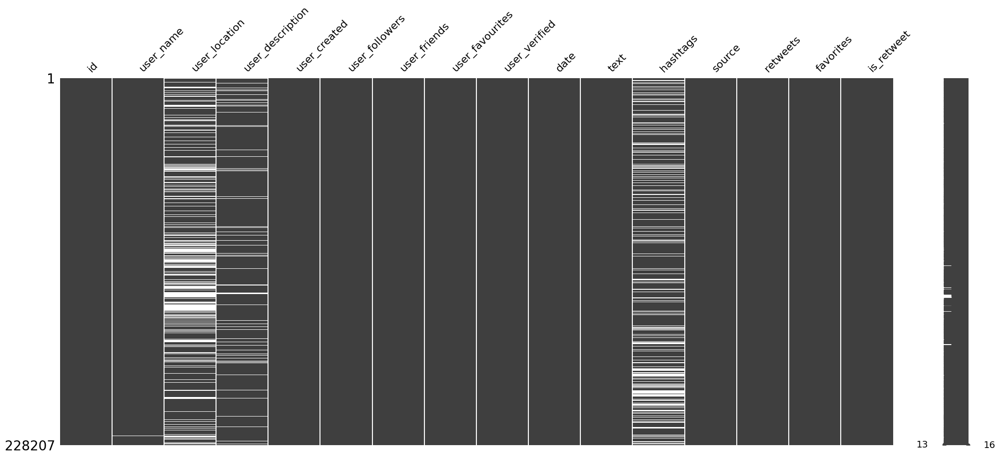

In [8]:
msno.matrix(df) 

In [9]:
df.isna().sum()
# Мы видим, что в user_location, description, sources много недостающих данных.

id                      0
user_name               2
user_location       66911
user_description    17023
user_created            0
user_followers          0
user_friends            0
user_favourites         0
user_verified           0
date                    0
text                    0
hashtags            49703
source                119
retweets                0
favorites               0
is_retweet              0
dtype: int64

In [10]:
df=df.drop_duplicates('text')             #dropping duplicate tweets
df.shape

(226373, 16)

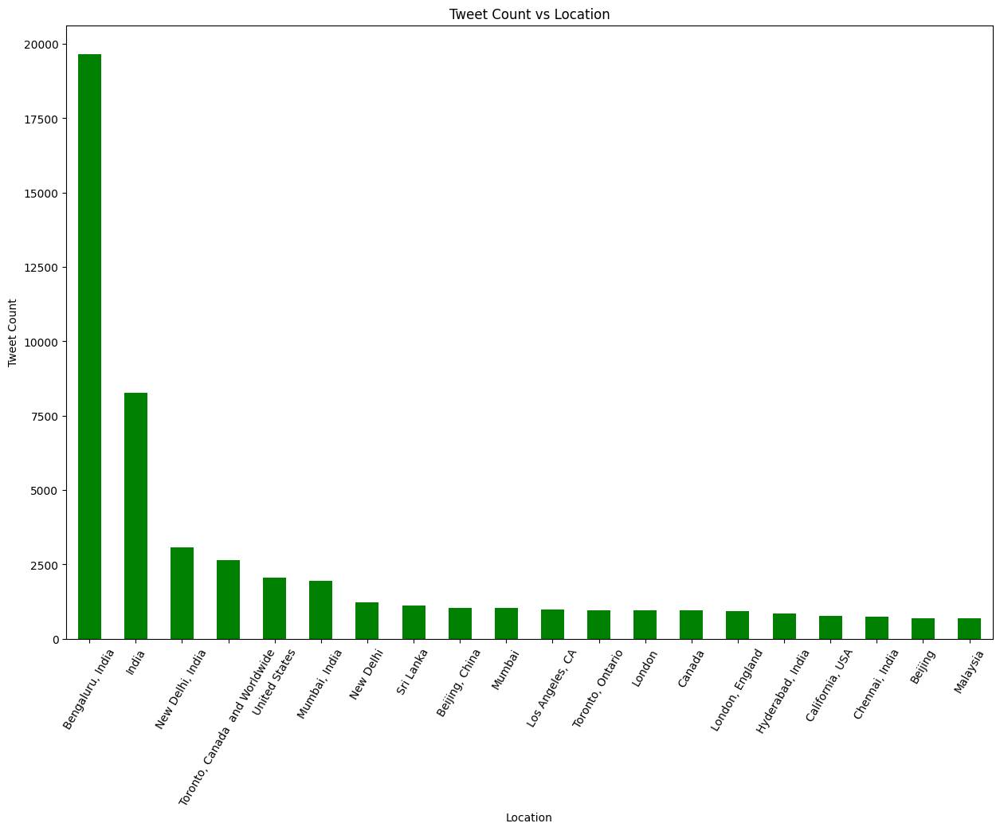

In [11]:
# Визуализация Tweet Count vs Location
plt.figure(figsize=(15,10))
df['user_location'].value_counts().nlargest(20).plot(kind='bar', color='green')

# Настройка осей и меток
plt.xticks(rotation=60)
plt.xlabel('Location')
plt.ylabel('Tweet Count')
plt.title('Tweet Count vs Location')

# Отображение графика
plt.show()

<Axes: >

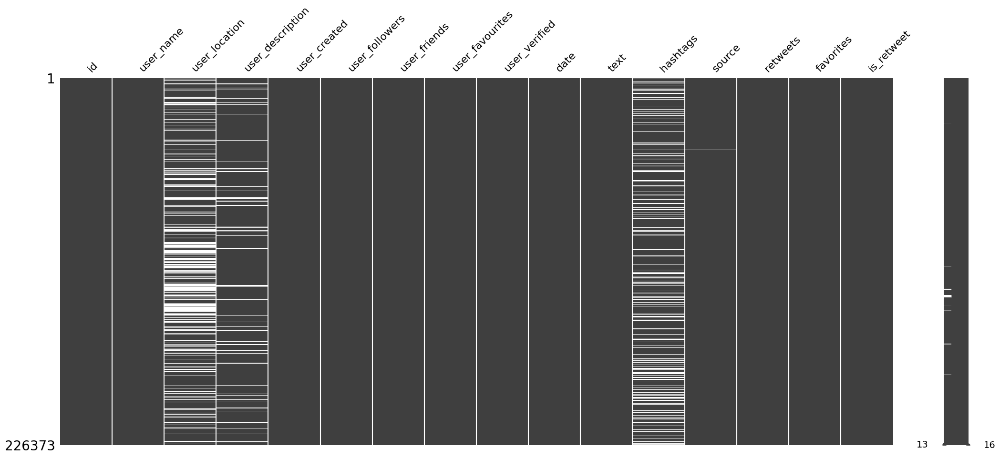

In [12]:
msno.matrix(df) 

In [13]:
df.source.value_counts()


source
Twitter for Android            58553
Twitter Web App                57050
Twitter for iPhone             49396
CowinAlertsBot                 11276
cowin_vaccine_app              10203
                               ...  
newsR                              1
todayinnevada                      1
Collected Times Top Stories        1
Breaking Market News               1
TrialStat-WP2Twtr                  1
Name: count, Length: 379, dtype: int64

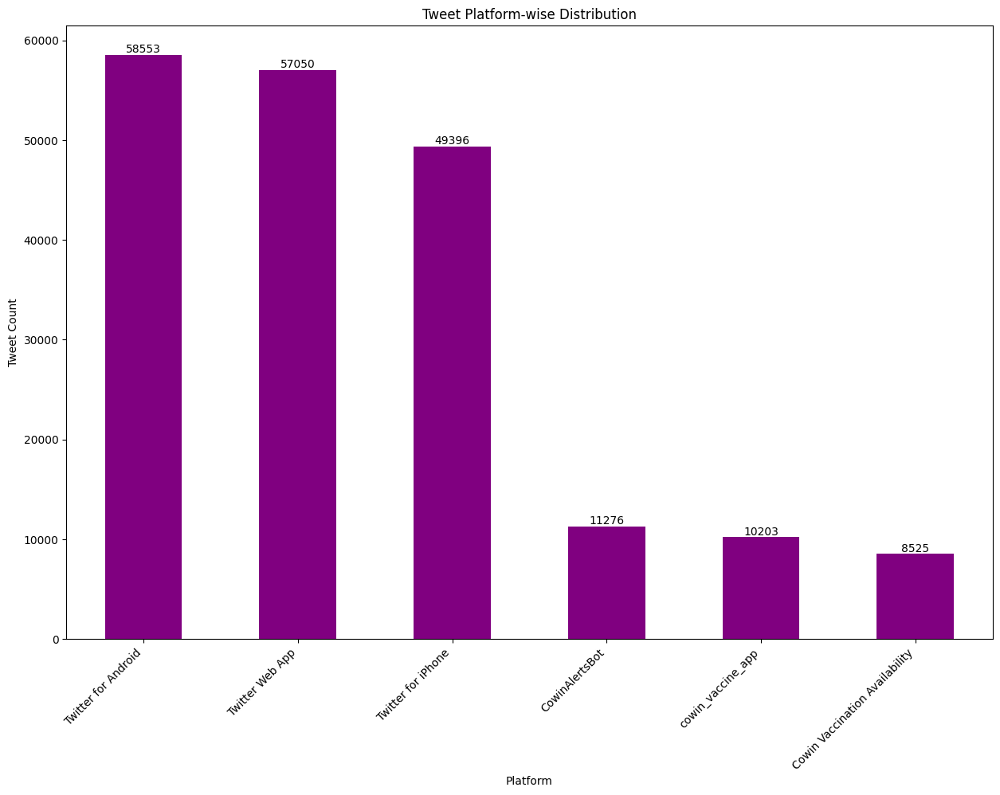

In [14]:
# Визуализация Tweet Platform-wise Distribution
plt.figure(figsize=(15,10))
platform_counts = df['source'].value_counts().nlargest(6)
platform_counts.plot(kind='bar', color='purple')

# Настройка осей и меток
plt.xlabel('Platform')
plt.ylabel('Tweet Count')
plt.title('Tweet Platform-wise Distribution')

# Установка меток на оси x
plt.xticks(rotation=45, ha='right', fontsize=10)

# Добавление значения над каждым столбиком
for i, count in enumerate(platform_counts):
    plt.text(i, count, str(count), ha='center', va='bottom')

# Отображение графика
plt.show()

In [15]:
len(df['date'].unique())  #Number of days considered


319

In [16]:
df.sort_values(by=['date'], ascending=[True]).head(2)


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
294,1337884374927368201,Nacindex,NaN,Tweet and RT all things #OpenFinance #bitcoin ...,2019-03-16 15:14:32,331,431,1132,False,2020-12-12,https://t.co/Z3j0NbDUbq\nUS agency authorizes ...,NaN,Twitter Web App,1,0,False
34,1337742528108519424,Rajat Kotra,"London, England","Ever-curious polymath,#global leader#startups#...",2009-12-03 12:03:28,754,917,220,False,2020-12-12,Vaccine!! Anyone?? #covid #Pfizervaccine #Pfiz...,"['covid', 'Pfizervaccine', 'PfizerBioNTech']",Twitter for Android,0,0,False


It's visible that the dataset has covid vaccine related tweets from 12th December ,2020



In [17]:
df.drop(columns={"id","user_name","user_description","user_created","user_followers",\
                   "user_friends","user_favourites","user_verified","hashtags","source","retweets","favorites","is_retweet"},inplace=True)
# dropping unnecessary 

In [18]:
df.head()

,user_location,date,text
0,"La Crescenta-Montrose, CA",2020-12-20,Same folks said daikon paste could treat a cyt...
1,"San Francisco, CA",2020-12-13,While the world has been on the wrong side of ...
2,Your Bed,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,"Vancouver, BC - Canada",2020-12-12,"Facts are immutable, Senator, even when you're..."
4,NaN,2020-12-12,Explain to me again why we need a vaccine @Bor...


In [19]:

def remove_hashtags(text):
    # Удаление хэштегов
    cleaned_text = re.sub(r'#\w+', '', text)
    return cleaned_text

def remove_urls(text):
    # Удаление ссылок
    cleaned_text = re.sub(r'http\S+', '', text)
    return cleaned_text

def remove_userhandles(text):
    # Удаление упоминаний пользователей
    cleaned_text = re.sub(r'@\w+', '', text)
    return cleaned_text

def remove_multiple_spaces(text):
    # Удаление множественных пробелов
    cleaned_text = re.sub(r'\s+', ' ', text)
    return cleaned_text

def remove_special_characters(text):
    # Удаление специальных символов и знаков пунктуации
    cleaned_text = re.sub(r'[^\w\s]', '', text)
    return cleaned_text

# Применение функций очистки к столбцу 'text'
df['clean_data'] = df['text'].apply(remove_hashtags)
df['clean_data'] = df['clean_data'].apply(remove_urls)
df['clean_data'] = df['clean_data'].apply(remove_userhandles)
df['clean_data'] = df['clean_data'].apply(remove_multiple_spaces)
df['clean_data'] = df['clean_data'].apply(remove_special_characters)

In [20]:
df[['clean_data','text']].head()

,clean_data,text
0,Same folks said daikon paste could treat a cyt...,Same folks said daikon paste could treat a cyt...
1,While the world has been on the wrong side of ...,While the world has been on the wrong side of ...
2,Russian vaccine is created to last 24 years,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,Facts are immutable Senator even when youre no...,"Facts are immutable, Senator, even when you're..."
4,Explain to me again why we need a vaccine,Explain to me again why we need a vaccine @Bor...


## Assigning Polarity & Subjectivity to tweets

In [21]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alyona_dushkina/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/alyona_dushkina/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [22]:
#stopwords are the words which won't bring about any changes to the polarity of the tweet
stop_words = stopwords.words('english')   
len(stop_words),stop_words[5:10]

(179, ['our', 'ours', 'ourselves', 'you', "you're"])

In [23]:
# function to remove stopwords
def stopWords(tweet):
  clean_tweet = tweet
  clean_tweet = " ".join(word for word in clean_tweet.split() if word not in stop_words)
# clean_tweet = " ".join(lemmatizer.lemmatize(word) for word in clean_tweet.split())
  return clean_tweet

In [24]:
df['clean_data'] = df['clean_data'].apply(lambda x: stopWords(x))


In [25]:
df.head()


,user_location,date,text,clean_data
0,"La Crescenta-Montrose, CA",2020-12-20,Same folks said daikon paste could treat a cyt...,Same folks said daikon paste could treat cytok...
1,"San Francisco, CA",2020-12-13,While the world has been on the wrong side of ...,While world wrong side history year hopefully ...
2,Your Bed,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,Russian vaccine created last 24 years
3,"Vancouver, BC - Canada",2020-12-12,"Facts are immutable, Senator, even when you're...",Facts immutable Senator even youre ethically s...
4,NaN,2020-12-12,Explain to me again why we need a vaccine @Bor...,Explain need vaccine


In [26]:
from textblob import TextBlob
# Function to assign polarity and subjectivity to the tweets
def blob_fun(text):
  senti = TextBlob(text)
  senti_polarity = senti.sentiment.polarity
  senti_subjectivity = senti.sentiment.subjectivity

  if senti_polarity > 0:
    res = 'Positive'

  elif senti_polarity < 0:
    res = 'Negative'

  elif senti_polarity == 0:
    res ="Neutral"

  result = {'polarity':senti_polarity,'subjectivity':senti_subjectivity,'sentiment':res}

  return result

In [27]:
blob_fun(df['clean_data'][5])


{'polarity': 0.4, 'subjectivity': 0.25, 'sentiment': 'Positive'}

In [28]:
df['results'] = df['clean_data'].apply(blob_fun)


In [29]:
df.drop(columns={"user_location",'text'},inplace=True)


In [30]:
df.head()


,date,clean_data,results
0,2020-12-20,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent..."
1,2020-12-13,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti..."
2,2020-12-12,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333..."
3,2020-12-12,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti..."
4,2020-12-12,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim..."


In [31]:
df = df.join(pd.json_normalize(data=df['results']))


In [32]:
df.head()

,date,clean_data,results,polarity,subjectivity,sentiment
0,2020-12-20,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,2020-12-13,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,2020-12-12,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,2020-12-12,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,2020-12-12,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [33]:
# categorized tweets in seperate Series
positive_tweet =  df[df['sentiment'] == 'Positive']['clean_data']
negative_tweet =  df[df['sentiment'] == 'Negative']['clean_data']
neutral_tweet =  df[df['sentiment'] == 'Neutral']['clean_data']

In [34]:

# creating WordClouds
def cloud_of_Words(tweet_cat,title):
    forcloud = ' '.join([tweet for tweet in tweet_cat])
    wordcloud = WordCloud(width =500,height = 300,random_state =5,max_font_size=110, colormap='Pastel1').generate(forcloud)
    plt.imshow(wordcloud, interpolation ='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()
    plt.figure(figsize = (10,8))

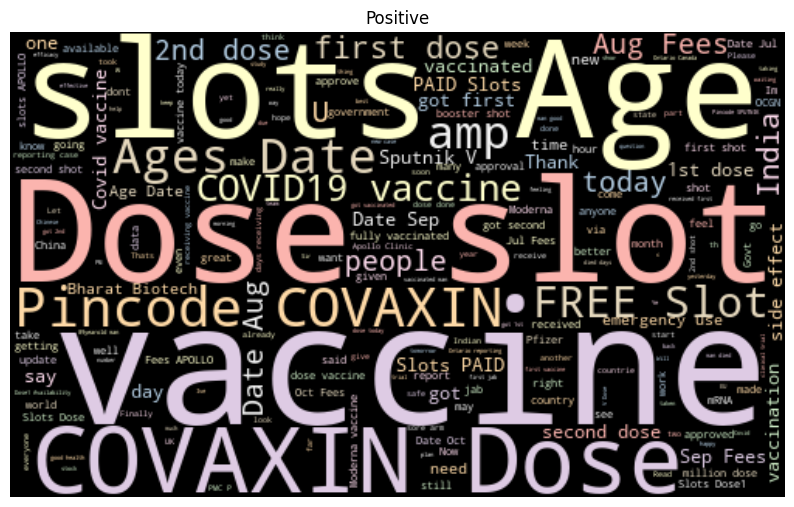

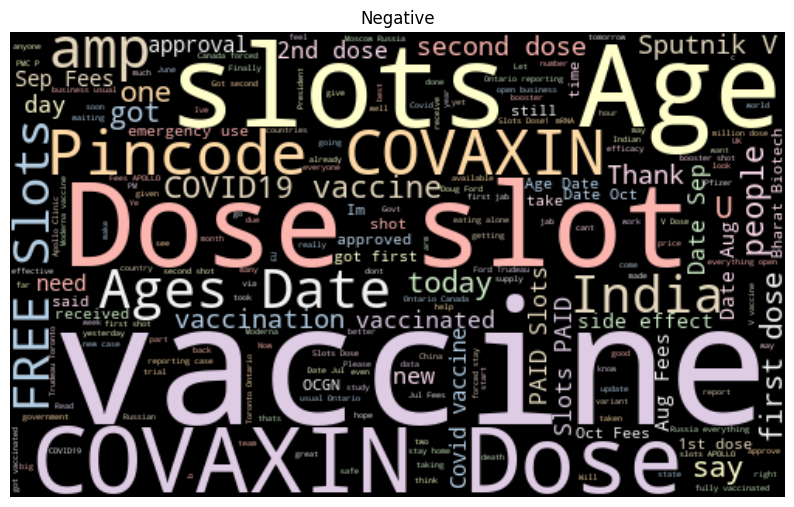

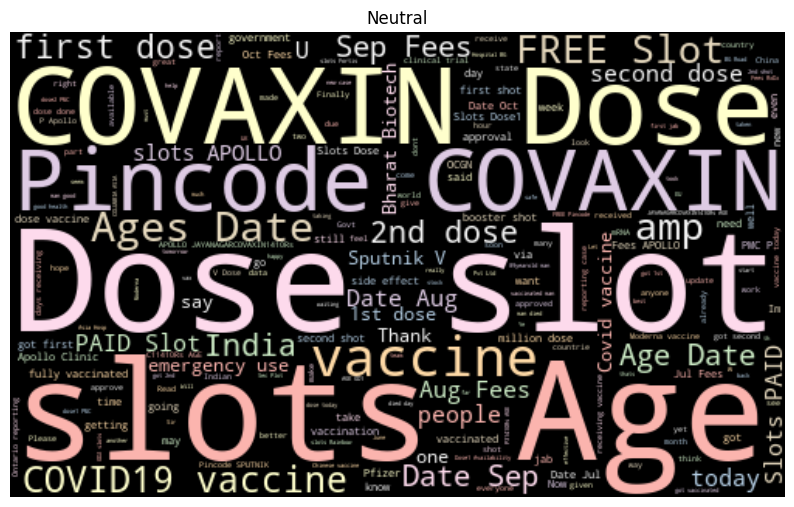

<Figure size 1000x800 with 0 Axes>

In [35]:
plt.figure(figsize = (10,8))
# Creating wordclouds for positive, negative, neutral tweets
cloud_of_Words(positive_tweet, 'Positive')
cloud_of_Words(negative_tweet, 'Negative')
cloud_of_Words(neutral_tweet, 'Neutral')

The above three wordclouds have the similar words as expected because our main analysis is Covid Vaccine

# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in positive_tweet for token in line.split()]
negative_tokens = [token for line in negative_tweet for token in line.split()]
neutral_tokens = [token for line in neutral_tweet for token in line.split()]

In [36]:
import nltk

# Breaking down the tweets into words in separate categories
positive_tokens = nltk.word_tokenize(' '.join(positive_tweet))
negative_tokens = nltk.word_tokenize(' '.join(negative_tweet))
neutral_tokens = nltk.word_tokenize(' '.join(neutral_tweet))


In [37]:
from collections import Counter
# to get most used words
def get_maxtoken(tweets,num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

In [44]:
def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(), columns=['words', 'count'])
  fig = px.bar(df, x='words', y='count', title=title, color='words')  # Изменение цвета по столбцу 'words'
  fig.show()

In [45]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

In [ ]:
# Создание графика рассеяния с помощью Plotly Express
fig = px.scatter(df, x='polarity', y='subjectivity', color='sentiment', title='Sentiment Analysis')
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='Black')))  # Изменение размера и цвета маркеров

fig.update_layout(
    xaxis=dict(title='Polarity'),  # Настройка подписи оси X
    yaxis=dict(title='Subjectivity'),  # Настройка подписи оси Y
    legend=dict(title='Sentiment'),  # Настройка подписи легенды
    showlegend=True  # Отображение легенды
)

fig.show()

In [51]:
def percent(x,y):
  return print("Percentage of "+y+" tweets :",round(len(x)/df.shape[0]*100,3),"%")

In [52]:
percent(positive_tweet, 'positive')
percent(negative_tweet, 'negative')
percent(neutral_tweet, 'neutral')

Percentage of positive tweets : 33.584 %
Percentage of negative tweets : 9.878 %
Percentage of neutral tweets : 55.729 %


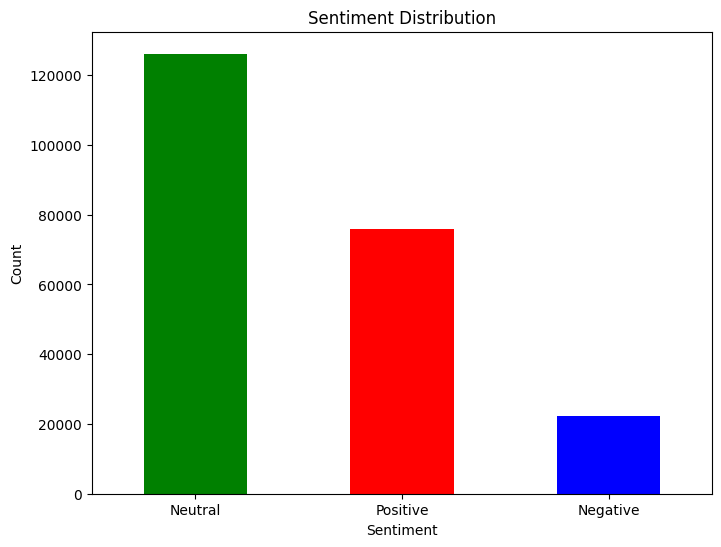

In [54]:
# Создание графика столбчатой диаграммы с использованием Matplotlib
sentiment_counts = df['sentiment'].value_counts()
plt.figure(figsize=(8, 6))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])  # Установка цветов столбцов

# Настройка внешнего вида графика
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()

## Vaccine-wise analysis

In [55]:
df.columns


Index(['date', 'clean_data', 'results', 'polarity', 'subjectivity',
       'sentiment'],
      dtype='object')

In [57]:
data = df.drop(columns="results")
data.head()

,date,clean_data,polarity,subjectivity,sentiment
0,2020-12-20,Same folks said daikon paste could treat cytok...,0.0,0.125000,Neutral
1,2020-12-13,While world wrong side history year hopefully ...,-0.5,0.900000,Negative
2,2020-12-12,Russian vaccine created last 24 years,0.0,0.033333,Neutral
3,2020-12-12,Facts immutable Senator even youre ethically s...,0.1,0.550000,Positive
4,2020-12-12,Explain need vaccine,0.0,0.000000,Neutral


In [58]:
# creating reference tags for 5 vaccines -> Pfizer, Covaxin(Bharat Biotech), Sputnik,AstraZenca(Covishield),Moderna
pfizer_refs = ["Pfizer","pfizer","Pfizer–BioNTech","pfizer-bioNtech","BioNTech","biontech"]
bbiotech_refs = ["covax","covaxin","Covax","Covaxin","Bharat Biotech","bharat biotech","BharatBiotech","bharatbiotech"]
sputnik_refs = ["russia","sputnik","Sputnik","V"]
astra_refs = ['sii','SII','adar poonawalla','Covishield','covishield','astra','zenca','Oxford–AstraZeneca','astrazenca','oxford-astrazenca','serum institiute']
moderna_refs = ['moderna','Moderna','mRNA-1273','Spikevax']


In [60]:
def refer(tweet, refs):
  flag =0
  for ref in refs:
    if tweet.find(ref) != -1:
      flag =1
  return flag

data['pfizer'] = data['clean_data'].apply(lambda x : refer(x, pfizer_refs))
data['bbiotech'] = data['clean_data'].apply(lambda x : refer(x, bbiotech_refs))
data['sputnik'] = data['clean_data'].apply(lambda x : refer(x, sputnik_refs))
data['astra'] = data['clean_data'].apply(lambda x : refer(x, astra_refs))
data['moderna'] = data['clean_data'].apply(lambda x : refer(x, moderna_refs))

In [63]:
display(data.pfizer.value_counts(),data.bbiotech.value_counts(),data.sputnik.value_counts(),data.astra.value_counts(),data.moderna.value_counts())

pfizer
0    222669
1      3704
Name: count, dtype: int64

bbiotech
0    218920
1      7453
Name: count, dtype: int64

sputnik
0    180191
1     46182
Name: count, dtype: int64

astra
0    225299
1      1074
Name: count, dtype: int64

moderna
0    219600
1      6773
Name: count, dtype: int64

In [64]:
data[data['bbiotech']==1].head()    #what the dataset looks like


,date,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
1592,2020-12-26,The country part Gavi Vaccine Alliance oversee...,0.000000,0.000000,Neutral,0,1,1,0,0
2202,2021-01-03,India approves AstraZeneca Bharat Biotech vacc...,0.000000,0.000000,Neutral,1,1,0,0,0
2383,2021-01-05,Covid19 Vaccine War Covaxin Maker Bharat Biote...,0.500000,0.500000,Positive,0,1,1,0,0
4138,2021-01-21,Covishield vs Covaxin vs ModernaPfizer Science...,0.227273,0.545455,Positive,1,1,1,1,1
5399,2021-02-07,Dr Bharat Biotech Signs US Partner IndiaApprov...,0.000000,0.000000,Neutral,0,1,1,0,0


In [65]:
data[data['pfizer']==1].head()


,date,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
23,2020-12-12,The US Food Drug Administration FDA granted em...,0.00,0.000000,Neutral,1,0,0,0,0
42,2020-12-12,BioNTech COVID19,0.00,0.000000,Neutral,1,0,1,0,0
66,2020-12-14,ICU nurse Sandra Lindsay said proud becoming o...,0.50,0.727778,Positive,1,0,0,0,0
88,2020-12-14,KFDMsFOX 4s Baptist hospital getting first han...,0.25,0.333333,Positive,1,0,1,0,0
94,2020-12-14,Toronto receive Ontarios 1st doses Pfizer COVI...,0.00,0.000000,Neutral,1,0,1,0,0


In [66]:
def stats(a,b,c,d,e):
  for i in a,b,c,d,e:
     display(data[data[i]==1][[i,'polarity','subjectivity']].groupby(i).agg([np.mean,np.max,np.min,np.median]))

In [67]:
stats('pfizer','bbiotech','sputnik','astra','moderna')


polarity                  subjectivity                 
            mean amax amin median         mean amax amin median
pfizer                                                         
1       0.092045  1.0 -1.0    0.0     0.247846  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
bbiotech                                                        
1         0.09377  1.0 -1.0    0.0     0.248939  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
sputnik                                                         
1        0.086738  1.0 -1.0    0.0     0.242783  1.0  0.0    0.0

polarity                  subjectivity                 
          mean amax amin median         mean amax amin median
astra                                                        
1      0.09345  1.0 -1.0    0.0     0.246778  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
moderna                                                         
1        0.097144  1.0 -1.0    0.0     0.263075  1.0  0.0    0.1

In [68]:
pfizer = data[data['pfizer']==1][['date','polarity']]
bbiotech = data[data['bbiotech']==1][['date','polarity']]
sputnik = data[data['sputnik']==1][['date','polarity']]
astra = data[data['astra']==1][['date','polarity']]
moderna = data[data['moderna']==1][['date','polarity']]

pfizer = pfizer.sort_values(by='date',ascending=True)
bbiotech = bbiotech.sort_values(by='date',ascending=True)
sputnik = sputnik.sort_values(by='date',ascending=True)
astra = astra.sort_values(by='date',ascending=True)
moderna = moderna.sort_values(by='date',ascending=True)

pfizer['Avg Polarity'] = pfizer.polarity.rolling(20, min_periods=3).mean()
bbiotech['Avg Polarity'] = bbiotech.polarity.rolling(20, min_periods=3).mean()
sputnik['Avg Polarity'] = sputnik.polarity.rolling(20, min_periods=3).mean()
astra['Avg Polarity'] = astra.polarity.rolling(5, min_periods=3).mean()
moderna['Avg Polarity'] = moderna.polarity.rolling(20, min_periods=3).mean()

In [69]:
bbiotech.head(10)


,date,polarity,Avg Polarity
1592,2020-12-26,0.000000,NaN
2202,2021-01-03,0.000000,NaN
2383,2021-01-05,0.500000,0.166667
4138,2021-01-21,0.227273,0.181818
5399,2021-02-07,0.000000,0.145455
5401,2021-02-07,0.300000,0.171212
5629,2021-02-07,0.500000,0.218182
5630,2021-02-07,0.000000,0.190909
5840,2021-02-08,0.800000,0.258586
6068,2021-02-08,0.000000,0.232727


## Visualizing the vaccine Polarity (Moving Average) vs Time

In [72]:
vaccines = {'Pfizer': a, 'Bharat Biotech': b, 'Sputnik': c, 'AstraZenece/Covishield': d, 'Moderna': e}

colors = ['red', 'blue', 'green', 'orange', 'purple']

for i, (vaccine, data) in enumerate(vaccines.items()):
    fig = px.line(data, x='date', y='Avg Polarity', title=vaccine, color_discrete_sequence=[colors[i]])
    fig.show()

### Visualizing Overall Vaccine Polarity

In [74]:
total=pd.DataFrame()
total['date'] = sorted(data['date'].unique())
senti=list()
for date in total['date']:
    senti.append(data[data['date']==date].polarity.mean())
total['Sentiment']=senti
fig = px.line(total, x="date", y="Sentiment", title='Overall Sentiment around Vaccines')
fig.show()   

In [77]:
data.head()

,date,clean_data,results,polarity,subjectivity,sentiment
0,2020-12-20,Same folks said daikon paste could treat cytok...,"{'polarity': 0.0, 'subjectivity': 0.125, 'sent...",0.0,0.125000,Neutral
1,2020-12-13,While world wrong side history year hopefully ...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,2020-12-12,Russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,2020-12-12,Facts immutable Senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,2020-12-12,Explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


/Users/alyona_dushkina/anaconda3/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



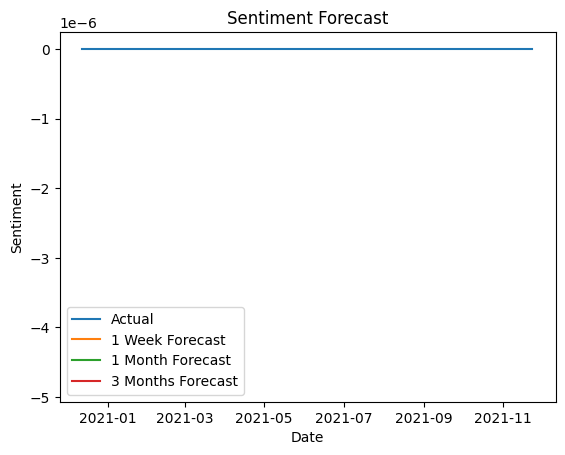

In [83]:
# Преобразование столбца 'sentiment' в числовой тип (int или float)
df['sentiment'] = pd.to_numeric(df['sentiment'], errors='coerce')

# Создание временного ряда настроений (например, посчитав количество положительных и отрицательных твитов по дням)
sentiment_series = df['sentiment'].resample('D').sum()

# Применение ARIMA для прогнозирования
model = ARIMA(sentiment_series, order=(1, 0, 0))
# Настройка параметров оптимизации
model_fit = model.fit()

# Прогноз на 1 неделю вперед
forecast_week = model_fit.forecast(steps=7)[0]

# Прогноз на 1 месяц вперед
forecast_month = model_fit.forecast(steps=30)[0]

# Прогноз на 3 месяца вперед
forecast_3months = model_fit.forecast(steps=90)[0]

# Визуализация прогноза
plt.plot(sentiment_series, label='Actual')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_week, label='1 Week Forecast')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_month, label='1 Month Forecast')
plt.plot(sentiment_series.index[-1] + pd.DateOffset(days=1), forecast_3months, label='3 Months Forecast')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Sentiment')
plt.title('Sentiment Forecast')
plt.show()
